In [1]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import pandas as pd

In [116]:
housing = pd.read_csv("train.csv")

In [117]:
housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [118]:
housing.shape

(1460, 81)

In [119]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [120]:
housing.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


##### Looking at the datatype above and comparing that with data dictionary it looks like the columns MsSubClass, OverallQual, OverallCond are all categorical variables and hence need to be converted from integer type. 
##### Similarly, Lotfrontage and MasVnrArea are numeric variables and hence need to be converted into numeric type

In [121]:
housing[['MSSubClass', 'OverallQual', 'OverallCond']] = housing[['MSSubClass', 'OverallQual', 'OverallCond']].astype('object')

In [122]:
housing['LotFrontage'] = pd.to_numeric(housing['LotFrontage'], errors='coerce')
housing['MasVnrArea'] = pd.to_numeric(housing['MasVnrArea'], errors='coerce')

##### Remove columns that have more than 95 percent of values associated to a specified value

In [123]:
def removeabove95percentvalues():
    column = []
    categorical_columns = housing.select_dtypes(include=['object'])
    for col in (categorical_columns):
        if((housing[col].value_counts().max()/housing.shape[0])*100 >= 95):
            column.append(col)
    return column

cat_remove_cols = removeabove95percentvalues()

# Remove the columns with skewed data

housing.drop(cat_remove_cols, axis = 1, inplace = True)

In [124]:
housing.shape

(1460, 76)

In [112]:
# column = []
# categorical_columns = housing.select_dtypes(include=['object'])
# for col in (categorical_columns):
#         if((housing[col].value_counts().max()/housing.shape[0])*100 >= 95):
#             column.append(col)
# print(column)


##### Check Duplicates

In [125]:
duplicate = housing[housing.duplicated()]
print("Duplicate Rows :")
duplicate

Duplicate Rows :


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


##### So we are good with 0 duplicate rows. Now we will check for NULLs

In [126]:
null_values = 100*(housing.isnull().sum()/len(housing.index))
null_values = null_values[null_values>0].sort_values(ascending = False)
null_values

PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
FireplaceQu     47.260274
LotFrontage     17.739726
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
BsmtExposure     2.602740
BsmtFinType2     2.602740
BsmtFinType1     2.534247
BsmtCond         2.534247
BsmtQual         2.534247
MasVnrArea       0.547945
MasVnrType       0.547945
Electrical       0.068493
dtype: float64

In [127]:
null_values_df = null_values.to_frame()

In [128]:
columns = list(null_values_df.index)
housing[columns].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PoolQC        7 non-null      object 
 1   MiscFeature   54 non-null     object 
 2   Alley         91 non-null     object 
 3   Fence         281 non-null    object 
 4   FireplaceQu   770 non-null    object 
 5   LotFrontage   1201 non-null   float64
 6   GarageType    1379 non-null   object 
 7   GarageYrBlt   1379 non-null   float64
 8   GarageFinish  1379 non-null   object 
 9   GarageQual    1379 non-null   object 
 10  GarageCond    1379 non-null   object 
 11  BsmtExposure  1422 non-null   object 
 12  BsmtFinType2  1422 non-null   object 
 13  BsmtFinType1  1423 non-null   object 
 14  BsmtCond      1423 non-null   object 
 15  BsmtQual      1423 non-null   object 
 16  MasVnrArea    1452 non-null   float64
 17  MasVnrType    1452 non-null   object 
 18  Electrical    1459 non-null 

##### Most of these are categorical variables and it seems from the data dictionary that the absence of these values might mean the absence of the given feature in house, e.g. PoolQC will be NULL if there is no pool in the house. It will obviously not be wise to remove rows as well since the data is so low. We will replace them with none.

In [129]:
columns = list(null_values_df.index)
num_columns = ['LotFrontage','GarageYrBlt','MasVnrArea']
cat_columns = [x for x in columns if x not in num_columns]
cat_columns

['PoolQC',
 'MiscFeature',
 'Alley',
 'Fence',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'BsmtExposure',
 'BsmtFinType2',
 'BsmtFinType1',
 'BsmtCond',
 'BsmtQual',
 'MasVnrType',
 'Electrical']

In [130]:
housing[cat_columns] = housing[cat_columns].fillna('None')

In [131]:
null_values = 100*(housing.isnull().sum()/len(housing.index))
null_values = null_values[null_values>0].sort_values(ascending = False)
null_values

LotFrontage    17.739726
GarageYrBlt     5.547945
MasVnrArea      0.547945
dtype: float64

##### Rest of them are all float and hence imputing them with their medians

In [132]:
housing["LotFrontage"].fillna(housing["LotFrontage"].median(), inplace=True)
housing["GarageYrBlt"].fillna(housing["GarageYrBlt"].median(), inplace=True)
housing["MasVnrArea"].fillna(housing["MasVnrArea"].median(), inplace=True)

In [133]:
null_values = 100*(housing.isnull().sum()/len(housing.index))
null_values = null_values[null_values>0].sort_values(ascending = False)
null_values

Series([], dtype: float64)

##### Dropping the ID columns

In [134]:
housing = housing.drop(['Id'], axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,None,Reg,Lvl,Inside,Gtl,CollgCr,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,None,Reg,Lvl,FR2,Gtl,Veenker,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,None,IR1,Lvl,Inside,Gtl,CollgCr,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,None,IR1,Lvl,Corner,Gtl,Crawfor,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,None,IR1,Lvl,FR2,Gtl,NoRidge,...,0,None,None,None,0,12,2008,WD,Normal,250000


In [135]:
housing.describe()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,69.863699,10516.828082,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,22.027677,9981.264932,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,21.000000,1300.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,60.000000,7553.500000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,69.000000,9478.500000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,79.000000,11601.500000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,313.000000,215245.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


##### Dividing into numeric and categorical dataframes

In [136]:

housing_numeric = housing.select_dtypes(include=['int64', 'float64'])
housing_numeric.head()



,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,...,0,61,0,0,0,0,0,2,2008,208500
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,...,298,0,0,0,0,0,0,5,2007,181500
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,...,0,42,0,0,0,0,0,9,2008,223500
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,...,0,35,272,0,0,0,0,2,2006,140000
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,...,192,84,0,0,0,0,0,12,2008,250000


In [137]:
housing_numeric.describe()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,69.863699,10516.828082,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,22.027677,9981.264932,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,21.000000,1300.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,60.000000,7553.500000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,69.000000,9478.500000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,79.000000,11601.500000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,313.000000,215245.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [138]:

housing_categorical = housing.select_dtypes(include='object')
housing_categorical.head()

,MSSubClass,MSZoning,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,60,RL,None,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,...,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
1,20,RL,None,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,...,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
2,60,RL,None,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,...,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal
3,70,RL,None,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,...,Detchd,Unf,TA,TA,Y,None,None,None,WD,Abnorml
4,60,RL,None,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,...,Attchd,RFn,TA,TA,Y,None,None,None,WD,Normal


In [139]:
import seaborn as sns
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn import metrics
import matplotlib.pyplot as plt 
import os

##### Check for the distribution of sale price

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

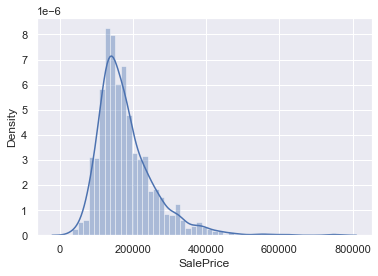

In [140]:
sns.distplot(housing['SalePrice'])

##### The values for the target variable is highly skewed towards the right, so we will apply simple log tranform to normalize the values

In [141]:
housing['SalePrice'] = np.log(housing['SalePrice'])

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

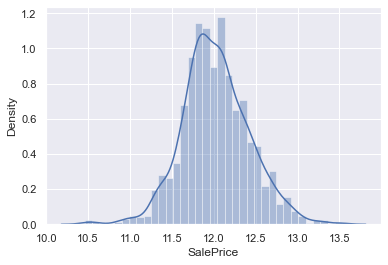

In [142]:
sns.distplot(housing['SalePrice'])

##### Target variable is following normal ditribution now

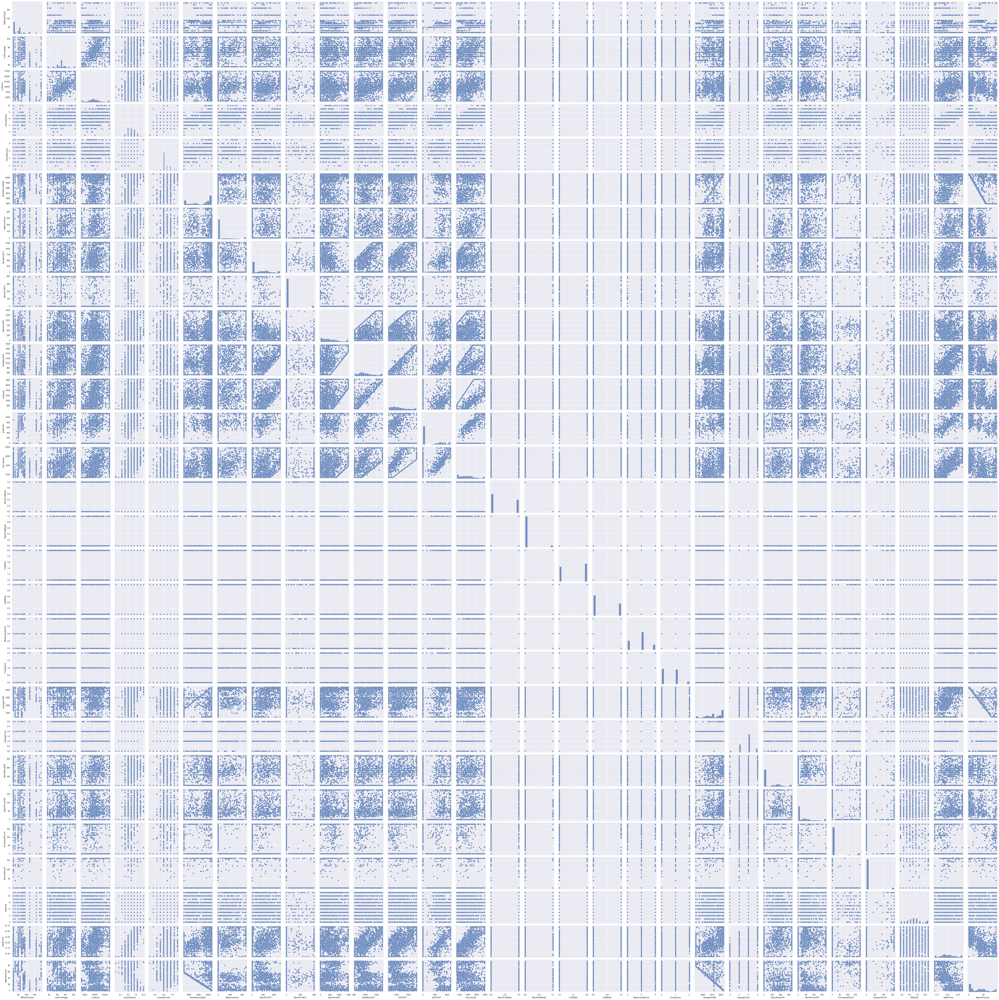

In [285]:
sns.set()
sns.pairplot(housing, size = 2.5)
plt.show()

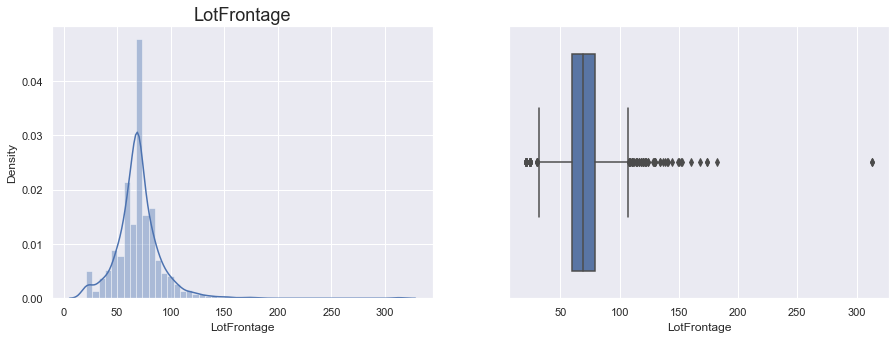

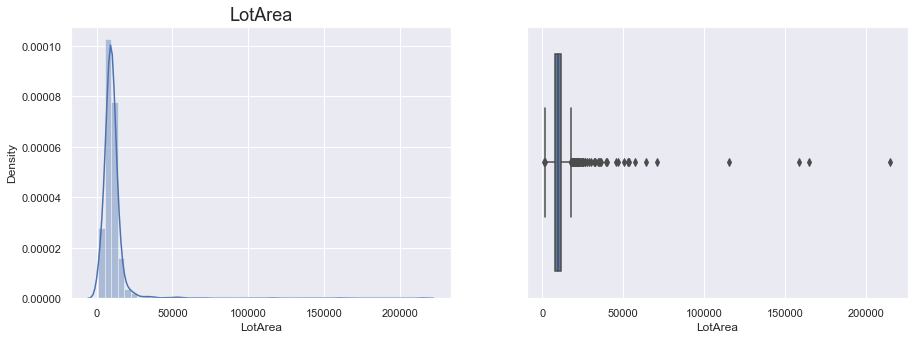

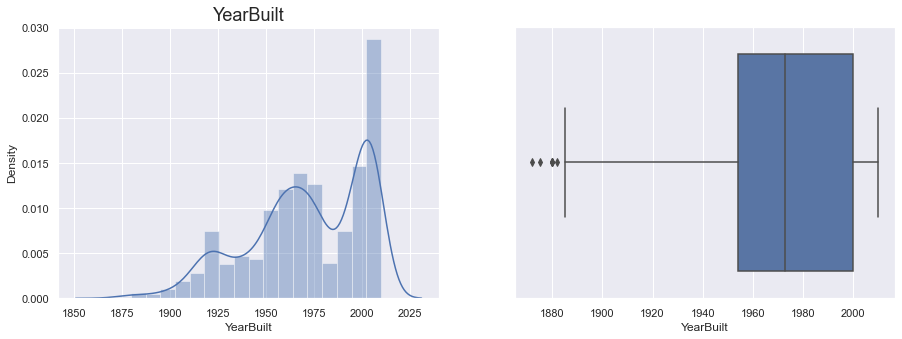

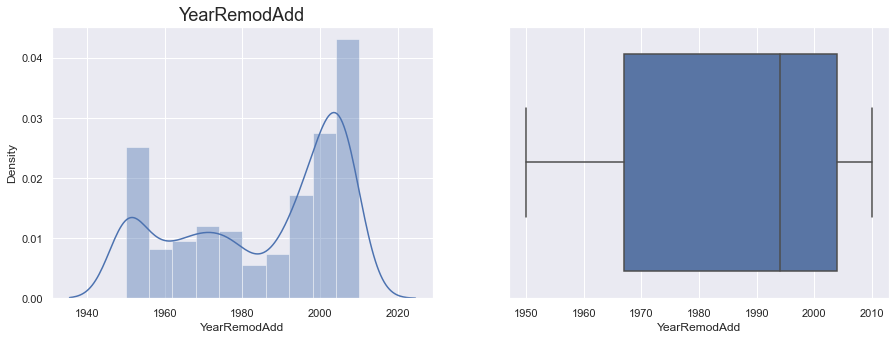

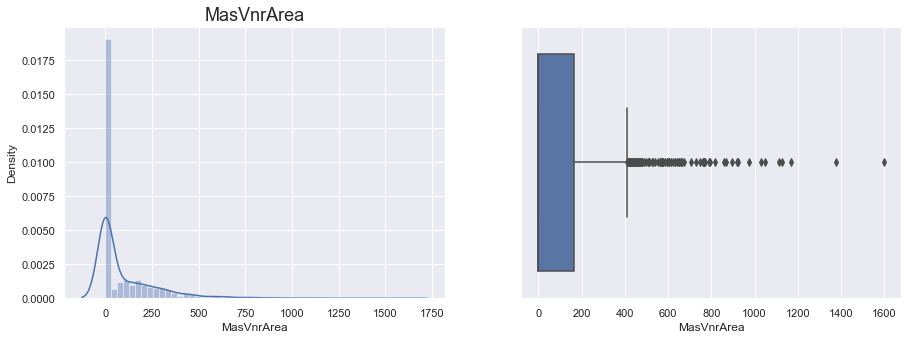

...

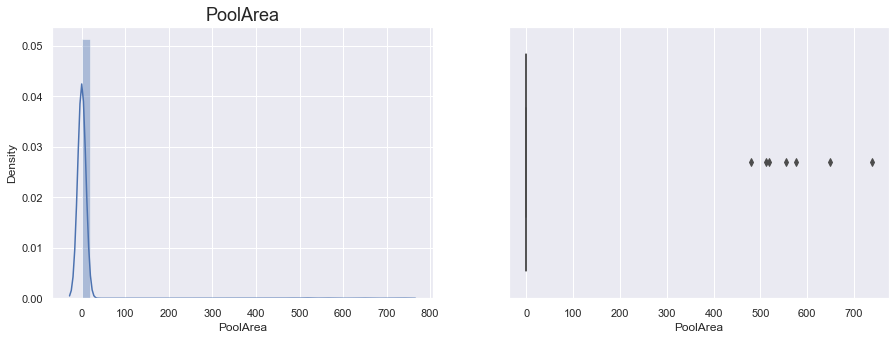

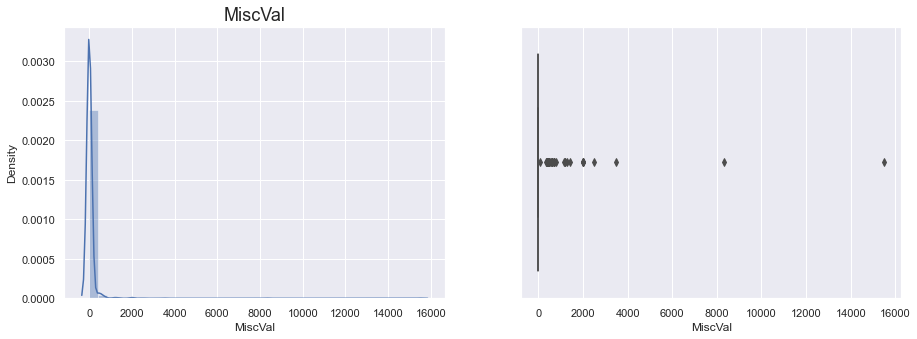

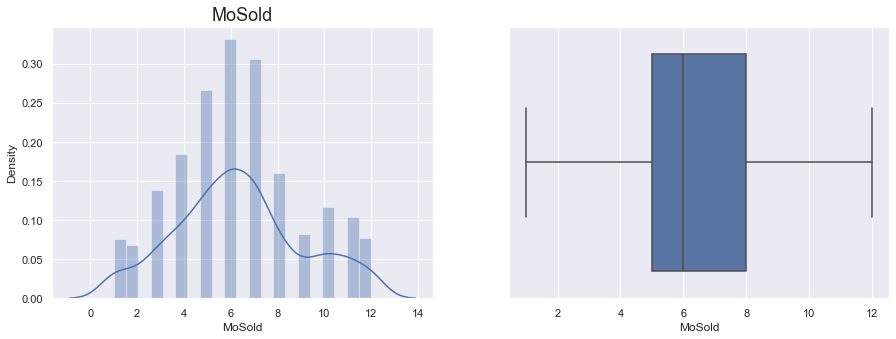

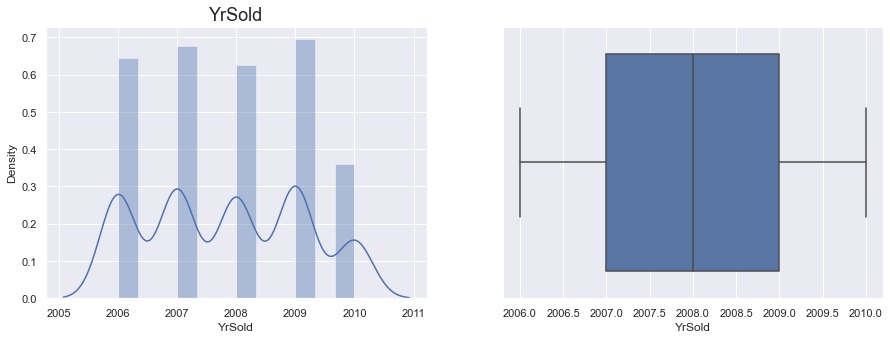

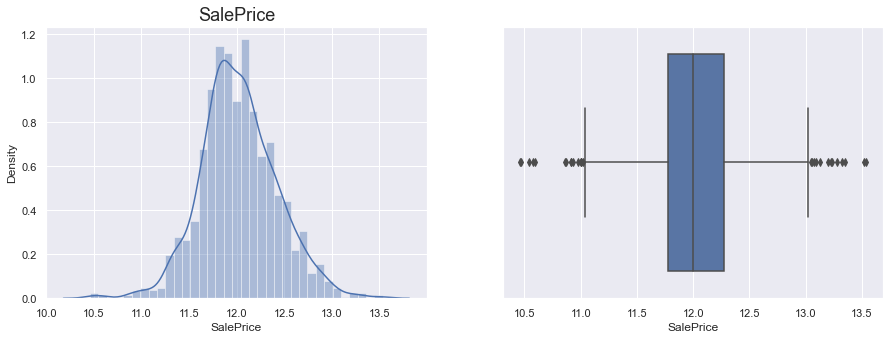

In [144]:
for col in housing_numeric.columns:
    plt.figure(figsize=(15,5))
    
    plt.subplot(1,2,1)
    plt.title(col, fontdict={'fontsize': 18})
    sns.distplot(housing[col])
    
    plt.subplot(1,2,2)
    sns.boxplot(housing[col])
    plt.show() 

In [146]:
housing_numeric.describe()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,69.863699,10516.828082,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,22.027677,9981.264932,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,21.000000,1300.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,60.000000,7553.500000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,69.000000,9478.500000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,79.000000,11601.500000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,313.000000,215245.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


##### There are some columns which are highly skewed, evident from the boxplots and the describe method and hence we will not replace the value which are less than 5 percentile and more than 95 percentile

In [148]:
for col in housing_numeric.columns:
    housing[col][housing[col] <= housing[col].quantile(0.05)] = housing[col].quantile(0.05)
    housing[col][housing[col] >= housing[col].quantile(0.95)] = housing[col].quantile(0.95)

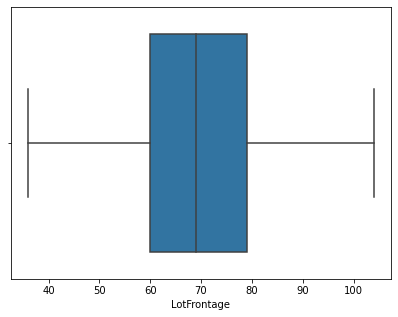

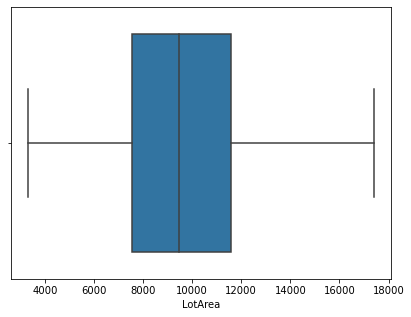

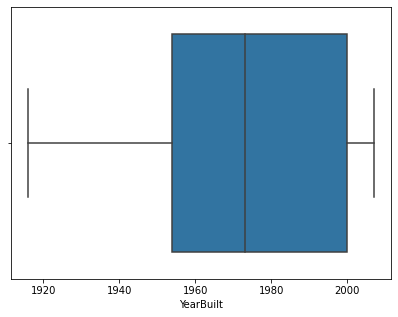

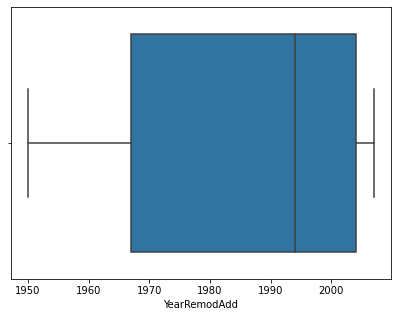

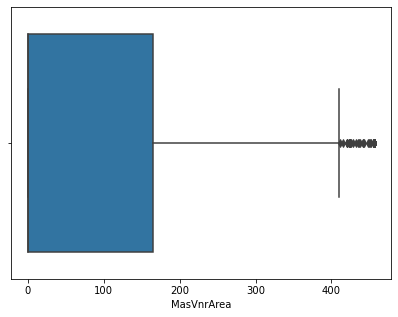

...

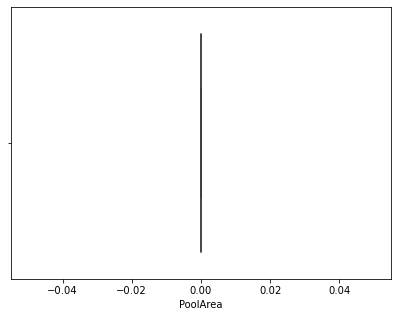

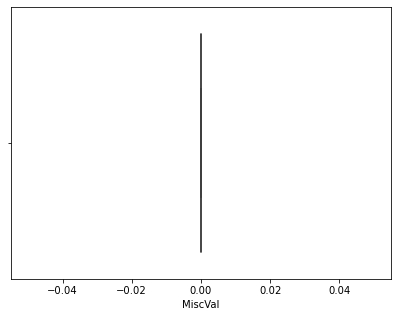

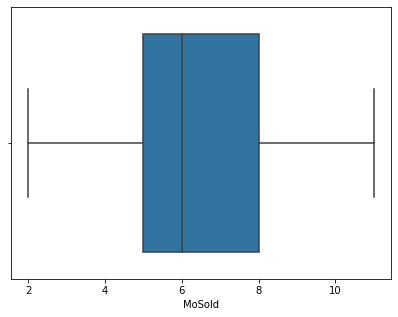

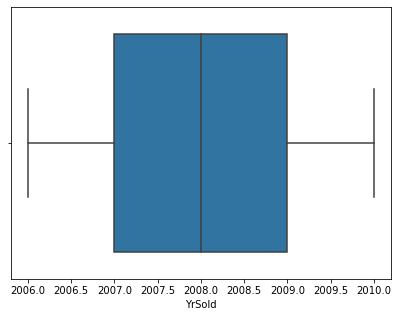

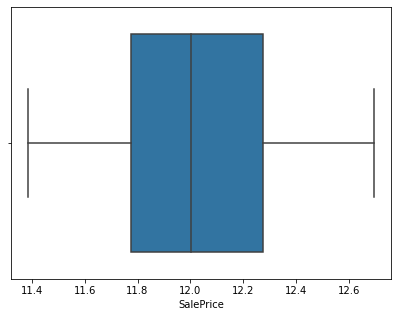

In [66]:
for col in housing_numeric.columns:
    plt.figure(figsize=(15,5))
    
    
    plt.subplot(1,2,2)
    sns.boxplot(housing[col])
    plt.show() 

In [71]:
list(housing_numeric.columns)

['LotFrontage',
 'LotArea',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice']

##### Let's check the numeric features correlation and distribution via pairplot

In [ ]:

sns.set()
columns = list(housing_numeric.columns)
sns.pairplot(housing[columns], size = 2.5)
plt.show()

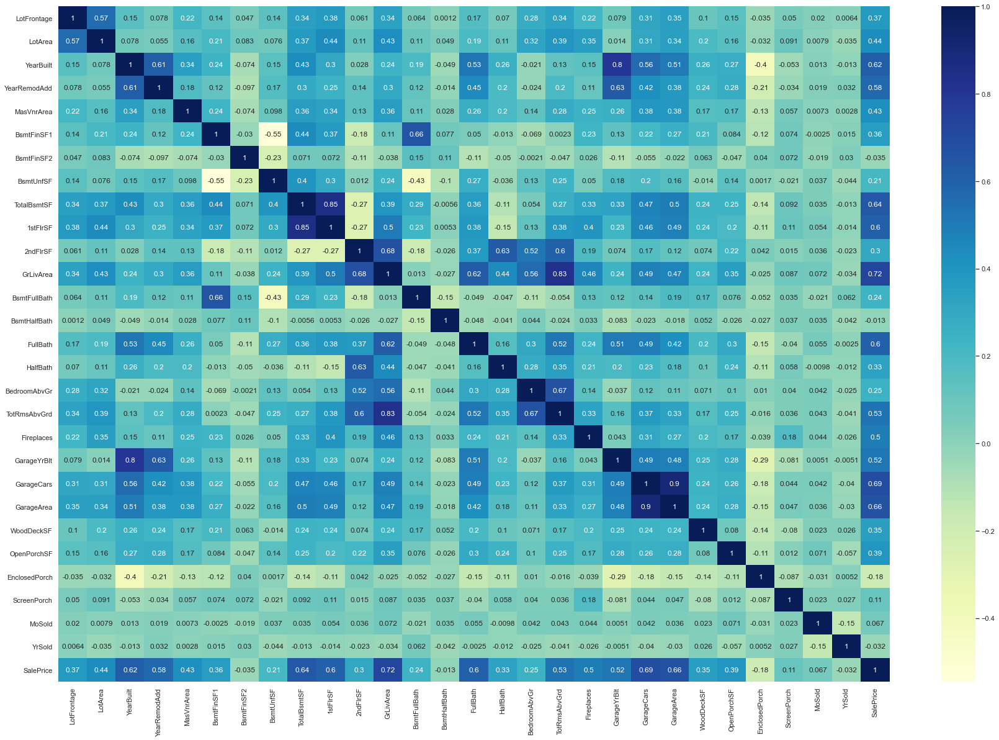

In [156]:
cor = housing.corr()
plt.figure(figsize=(30,20))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

##### Remove one of the features which have high correlation among themelves

In [159]:
#We are going to remove yearbuilt so garageyrblt we will retain
housing.drop(['TotRmsAbvGrd', 'GarageArea'], axis = 1, inplace = True)

##### From above graph remove columns having only 1 value

In [154]:
def removecatonevalue():
    column = []
    nunique = housing.nunique()
    column = nunique[nunique == 1].index
    return column

cat_remove_cols = removecatonevalue()

# Remove the columns with skewed data

housing.drop(cat_remove_cols, axis = 1, inplace = True)

In [160]:
housing.shape

(1460, 67)

In [153]:
nunique = housing.nunique()
cols_to_drop = nunique[nunique == 1].index
df.drop(cols_to_drop, axis=1)

Index(['LowQualFinSF', 'KitchenAbvGr', '3SsnPorch', 'PoolArea', 'MiscVal'], dtype='object')

##### Calculate the value of age of the house

In [157]:
housing['AgeOfHouse'] = housing['YrSold'] - housing['YearBuilt']

##### Drop YrSold and YearBuilt

In [158]:
housing.drop(['YrSold', 'YearBuilt'], axis=1, inplace=True)

In [162]:
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,EnclosedPorch,ScreenPorch,PoolQC,Fence,MiscFeature,MoSold,SaleType,SaleCondition,SalePrice,AgeOfHouse
0,60,RL,65.0,8450.0,None,Reg,Lvl,Inside,Gtl,CollgCr,...,0.00,0,None,None,None,2,WD,Normal,12.247694,5
1,20,RL,80.0,9600.0,None,Reg,Lvl,FR2,Gtl,Veenker,...,0.00,0,None,None,None,5,WD,Normal,12.109011,31
2,60,RL,68.0,11250.0,None,IR1,Lvl,Inside,Gtl,CollgCr,...,0.00,0,None,None,None,9,WD,Normal,12.317167,7
3,70,RL,60.0,9550.0,None,IR1,Lvl,Corner,Gtl,Crawfor,...,180.15,0,None,None,None,2,WD,Abnorml,11.849398,90
4,60,RL,84.0,14260.0,None,IR1,Lvl,FR2,Gtl,NoRidge,...,0.00,0,None,None,None,11,WD,Normal,12.429216,8


In [164]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 67 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   object 
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   float64
 4   Alley          1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   LotConfig      1460 non-null   object 
 8   LandSlope      1460 non-null   object 
 9   Neighborhood   1460 non-null   object 
 10  Condition1     1460 non-null   object 
 11  BldgType       1460 non-null   object 
 12  HouseStyle     1460 non-null   object 
 13  OverallQual    1460 non-null   object 
 14  OverallCond    1460 non-null   object 
 15  YearRemodAdd   1460 non-null   int64  
 16  RoofStyle      1460 non-null   object 
 17  Exterior1st    1460 non-null   object 
 18  Exterior

##### Creation of dummies by using one hot encoding

In [165]:
housing_dum = pd.get_dummies(housing, drop_first=True )
housing_dum.head()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0,8450.0,2003,196.0,706,0.0,150,856.0,856.0,854.0,...,0,0,0,0,1,0,0,0,1,0
1,80.0,9600.0,1976,0.0,978,0.0,284,1262.0,1262.0,0.0,...,0,0,0,0,1,0,0,0,1,0
2,68.0,11250.0,2002,162.0,486,0.0,434,920.0,920.0,866.0,...,0,0,0,0,1,0,0,0,1,0
3,60.0,9550.0,1970,0.0,216,0.0,540,756.0,961.0,756.0,...,0,0,0,0,1,0,0,0,0,0
4,84.0,14260.0,2000,350.0,655,0.0,490,1145.0,1145.0,1053.0,...,0,0,0,0,1,0,0,0,1,0


In [166]:
housing_dum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 260 entries, LotFrontage to SaleCondition_Partial
dtypes: float64(12), int64(14), uint8(234)
memory usage: 630.3 KB


In [167]:
X = housing_dum.drop(["SalePrice"], axis=1).copy()
X.head()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0,8450.0,2003,196.0,706,0.0,150,856.0,856.0,854.0,...,0,0,0,0,1,0,0,0,1,0
1,80.0,9600.0,1976,0.0,978,0.0,284,1262.0,1262.0,0.0,...,0,0,0,0,1,0,0,0,1,0
2,68.0,11250.0,2002,162.0,486,0.0,434,920.0,920.0,866.0,...,0,0,0,0,1,0,0,0,1,0
3,60.0,9550.0,1970,0.0,216,0.0,540,756.0,961.0,756.0,...,0,0,0,0,1,0,0,0,0,0
4,84.0,14260.0,2000,350.0,655,0.0,490,1145.0,1145.0,1053.0,...,0,0,0,0,1,0,0,0,1,0


In [168]:
y = housing_dum["SalePrice"].copy()
y.head()

0    12.247694
1    12.109011
2    12.317167
3    11.849398
4    12.429216
Name: SalePrice, dtype: float64

In [170]:
from sklearn.linear_model import Ridge, Lasso

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.metrics import r2_score, mean_squared_error

In [171]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

In [172]:
numeric_cols = list(X_train.select_dtypes(include=['int64', 'float64']).columns)
numeric_cols

['LotFrontage',
 'LotArea',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ScreenPorch',
 'MoSold',
 'AgeOfHouse']

##### Implement standard scaling on the numeric columns

In [174]:
## Create a scaling instance
scaler = StandardScaler()

## Scale the numerical columns 
X_train[numeric_cols] = scaler.fit_transform(X_train[numeric_cols])
X_test[numeric_cols] = scaler.transform(X_test[numeric_cols])

In [176]:
X_train.describe()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1.168000e+03,1.168000e+03,1.168000e+03,1.168000e+03,1.168000e+03,1.168000e+03,1.168000e+03,1.168000e+03,1.168000e+03,1.168000e+03,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,-3.055014e-16,2.556935e-16,-4.359907e-15,7.252570e-17,5.094859e-17,1.930533e-16,-6.843841e-17,-3.098739e-17,5.469369e-16,1.052240e-16,...,0.003425,0.003425,0.083048,0.001712,0.866438,0.003425,0.005993,0.015411,0.825342,0.083904
std,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,...,0.058445,0.058445,0.276073,0.041363,0.340326,0.058445,0.077216,0.123233,0.379837,0.277363
min,-2.011441e+00,-1.863413e+00,-1.687011e+00,-6.659882e-01,-1.053619e+00,-3.232549e-01,-1.336544e+00,-1.554371e+00,-1.457848e+00,-8.214628e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-5.582927e-01,-6.265467e-01,-9.118617e-01,-6.659882e-01,-1.053619e+00,-3.232549e-01,-8.052300e-01,-7.576398e-01,-8.132016e-01,-8.214628e-01,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,-1.449506e-02,-4.428172e-02,4.446487e-01,-6.659882e-01,-1.181853e-01,-3.232549e-01,-1.903390e-01,-1.774402e-01,-1.926859e-01,-8.214628e-01,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,5.897245e-01,5.632237e-01,9.291167e-01,5.126306e-01,7.004717e-01,-3.232549e-01,5.982737e-01,6.914195e-01,7.118581e-01,9.254508e-01,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,2.100274e+00,2.212500e+00,1.074457e+00,2.571663e+00,2.045843e+00,3.697765e+00,2.168932e+00,1.997948e+00,2.014342e+00,1.916608e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### Before going into ridge and lambda regression we can try and implement simple linear regression using RFE

In [186]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.metrics import r2_score, mean_squared_error

In [179]:
lm = LinearRegression()
lm.fit(X_train, y_train)
 # running RFE for top 100 variables out of 259 that we have
rfe = RFE(lm, 100)            
rfe = rfe.fit(X_train, y_train)

In [180]:
# Check the ranks
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', False, 106),
 ('LotArea', False, 8),
 ('YearRemodAdd', False, 52),
 ('MasVnrArea', False, 136),
 ('BsmtFinSF1', False, 142),
 ('BsmtFinSF2', False, 149),
 ('BsmtUnfSF', False, 2),
 ('TotalBsmtSF', True, 1),
 ('1stFlrSF', False, 69),
 ('2ndFlrSF', False, 43),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 117),
 ('BsmtHalfBath', False, 160),
 ('FullBath', False, 80),
 ('HalfBath', False, 79),
 ('BedroomAbvGr', False, 110),
 ('Fireplaces', False, 56),
 ('GarageYrBlt', False, 107),
 ('GarageCars', True, 1),
 ('WoodDeckSF', False, 83),
 ('OpenPorchSF', False, 84),
 ('EnclosedPorch', False, 155),
 ('ScreenPorch', False, 85),
 ('MoSold', False, 158),
 ('AgeOfHouse', True, 1),
 ('MSSubClass_30', False, 30),
 ('MSSubClass_40', False, 104),
 ('MSSubClass_45', False, 42),
 ('MSSubClass_50', False, 74),
 ('MSSubClass_60', False, 150),
 ('MSSubClass_70', False, 55),
 ('MSSubClass_75', True, 1),
 ('MSSubClass_80', False, 28),
 ('MSSubClass_85', False, 81),
 ('MSSubClass_90', Tru

In [181]:
col = X_train.columns[rfe.support_]
# Creating X_train dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = pd.DataFrame(X_train[col])

In [182]:
X_train_rfe.head()

,TotalBsmtSF,GrLivArea,GarageCars,AgeOfHouse,MSSubClass_75,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSZoning_FV,...,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_Oth,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Normal,SaleCondition_Partial
254,0.733891,-0.436419,-1.063421,0.573296,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1066,-0.749002,0.136734,0.302999,-0.693737,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
638,-0.757640,-1.475677,-2.429841,1.908817,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
799,-0.944801,0.576076,-1.063421,1.155446,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
380,-0.095377,0.404354,-1.063421,1.703352,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [183]:
X_train_rfe.shape

(1168, 100)

In [184]:
# predict
y_train_pred = lm.predict(X_train)
metrics.r2_score(y_true=y_train, y_pred=y_train_pred)

0.9450939696360506

In [185]:
y_test_pred = lm.predict(X_test)
metrics.r2_score(y_true=y_test, y_pred=y_test_pred)

-7.147902890404727e+17

In [188]:
y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.9450939696360506
-7.147902890404727e+17
7.816153590953528
2.7881741685010362e+19
0.006691912321021856
9.548541672948754e+16


##### SInce the r2 and RSS values are so low we will look for alternate ways of applying linear regression, that is using Lasso and Ridge regression

### Ridge Regression

In [189]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [190]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 7.0}


In [191]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=10]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.069560,0.027730,0.019077,0.005061,0.0001,{'alpha': 0.0001},-0.077893,-0.089393,-0.087494,-0.088006,...,-0.084930,0.004356,26,-0.056982,-0.054606,-0.055353,-0.056218,-0.056953,-0.056022,0.000925
1,0.040612,0.008697,0.015931,0.005655,0.001,{'alpha': 0.001},-0.077829,-0.089351,-0.087444,-0.087935,...,-0.084870,0.004363,25,-0.056994,-0.054609,-0.055355,-0.056219,-0.056968,-0.056029,0.000930
2,0.033797,0.004034,0.014141,0.004295,0.01,{'alpha': 0.01},-0.077278,-0.088959,-0.086992,-0.087308,...,-0.084347,0.004403,24,-0.057097,-0.054635,-0.055379,-0.056226,-0.057096,-0.056086,0.000966
3,0.039696,0.010439,0.017180,0.007777,0.05,{'alpha': 0.05},-0.076144,-0.087603,-0.085537,-0.085551,...,-0.082859,0.004326,22,-0.057392,-0.054720,-0.055475,-0.056308,-0.057496,-0.056278,0.001077
4,0.041069,0.005810,0.016928,0.007224,0.1,{'alpha': 0.1},-0.075428,-0.086446,-0.084323,-0.084346,...,-0.081713,0.004225,21,-0.057603,-0.054813,-0.055602,-0.056420,-0.057852,-0.056458,0.001157


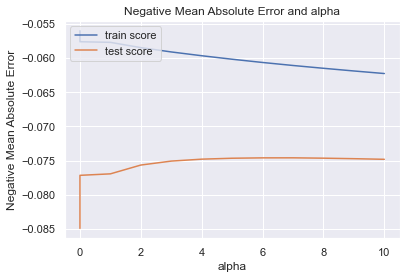

In [192]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [197]:
#Fitting Ridge model for alpha = 7 and printing coefficients which have been penalised
alpha = 7
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 6.02419006e-03  2.17559449e-02  2.20116055e-02 -2.87715632e-03
  5.26857549e-03 -1.64460147e-03 -1.96832396e-02  5.51740970e-02
  5.30421661e-03  2.48851434e-02  9.41329360e-02  8.99414176e-03
  1.21294692e-04  1.20208932e-02  1.40149750e-02  5.43186656e-03
  1.62848859e-02  3.59066936e-03  2.83448931e-02  1.20451066e-02
  7.75622200e-03  2.84461918e-03  1.02052917e-02 -1.35691525e-03
 -5.15948282e-02 -4.14510726e-02  6.75748663e-03  2.30289109e-03
 -5.54112713e-03 -5.09079101e-03  3.94080617e-02  3.79623609e-02
 -3.78895419e-03  4.64292305e-03 -4.15579108e-02  8.19695148e-03
 -6.00200698e-02 -1.33157505e-02 -2.32844517e-02  4.32363274e-02
  2.34904653e-02  9.92736207e-03 -2.56517595e-02 -7.58181986e-03
  1.43763648e-02  1.17120162e-02 -2.10700035e-02  5.40650192e-05
  3.79495823e-02  1.54022705e-02  1.81438066e-02  2.58896606e-02
 -2.17496516e-02 -1.13217787e-02 -1.50301817e-03 -3.27712781e-03
  3.74159936e-02 -5.60545670e-03 -6.18285272e-03  3.68832661e-02
  3.00644364e-02 -1.34197

In [198]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9378316262145683
0.9248627006720068
8.849985234514268
2.9308718975248818
0.007577042152837558
0.010037232525770143


##### Checking for some other value of alpha as well to ensure we have taken optimum alpha

In [275]:
#Fitting Ridge model for alpha = 4 and printing coefficients which have been penalised
alpha = 4
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 5.80497580e-03  2.16790592e-02  2.05946888e-02 -3.54833063e-03
  1.10972502e-03 -3.68927677e-03 -2.34391623e-02  5.87657544e-02
  5.90012625e-04  2.15249926e-02  9.96485402e-02  9.04753824e-03
 -4.99963373e-06  1.22215684e-02  1.40514418e-02  5.94956297e-03
  1.51414197e-02  3.29431151e-03  2.78589587e-02  1.21975840e-02
  7.65880876e-03  2.83434799e-03  1.01316004e-02 -1.31594448e-03
 -5.43425553e-02 -4.56615296e-02  7.03312704e-03  3.99743368e-03
 -3.97968241e-03 -5.50680654e-03  3.85109784e-02  4.99642375e-02
 -1.01063470e-02  1.75660986e-03 -4.69789555e-02  8.29579549e-03
 -6.39077573e-02 -1.48010211e-02 -2.61914451e-02  5.22774488e-02
  3.29685774e-02  1.23788624e-02 -2.23413404e-02 -1.00784690e-02
  1.28550547e-02  1.19267999e-02 -2.17597533e-02  7.58121512e-04
  4.23688161e-02  1.97311163e-02  2.34949039e-02  2.51731907e-02
 -2.48092167e-02 -1.96484874e-02 -2.46641738e-03 -3.49279646e-03
  4.87562990e-02 -8.92397102e-03 -4.54817216e-03  4.09458959e-02
  3.29898109e-02 -1.37322

In [276]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9401199787759836
0.9217570699945442
8.524226570635006
3.052012872221521
0.0072981391871875054
0.010452098877470962


##### Gap between train and test R2 increases and test R2 decreases so rejecting this. Lets try increasing alpha to 10 and check

In [277]:
#Fitting Ridge model for alpha = 10 and printing coefficients which have been penalised
alpha = 10
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 6.23394731e-03  2.18703155e-02  2.31251065e-02 -2.31875107e-03
  8.19451764e-03 -4.25466820e-04 -1.69537730e-02  5.29004829e-02
  8.55111621e-03  2.70466493e-02  9.02963747e-02  8.91643626e-03
  2.05290672e-04  1.18057069e-02  1.39544344e-02  5.05460525e-03
  1.71074207e-02  3.83308753e-03  2.88150781e-02  1.19332210e-02
  7.91361056e-03  2.87762346e-03  1.02747655e-02 -1.35998943e-03
 -4.95592165e-02 -3.81239818e-02  6.22895643e-03  1.47433508e-03
 -5.63591813e-03 -4.85867025e-03  3.95208874e-02  3.12063477e-02
 -6.81294769e-04  5.69941923e-03 -3.79642596e-02  8.13391651e-03
 -5.62285393e-02 -1.21368584e-02 -2.11634235e-02  3.85814928e-02
  1.84642415e-02  9.29729129e-03 -2.69598170e-02 -6.08176363e-03
  1.47054470e-02  1.13517265e-02 -1.96012779e-02 -6.22128695e-04
  3.46232292e-02  1.25053477e-02  1.44642110e-02  2.59369287e-02
 -1.96375492e-02 -7.55345918e-03 -8.76494479e-04 -2.78507549e-03
  3.09033418e-02 -4.16358169e-03 -6.85759367e-03  3.40826350e-02
  2.74765140e-02 -1.28011

In [278]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.935916528683896
0.9261843521299411
9.12260914016123
2.8793183927938513
0.007810453030959958
0.009860679427376203


##### The gap between test and train R2 increases slightly compared to alpha = 7 and hence lets stick with what has been suggested by cv.best_value_

##### The R2 score for train and test score for alpha =7 are quite high and close to each other and hence we can accept this value of alpha and move ahead on checking the coefficents

In [199]:
# ridge model parameters
model_parameters = list(ridge.coef_)
model_parameters.insert(0, ridge.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', 11.875),
 ('LotFrontage', 0.006),
 ('LotArea', 0.022),
 ('YearRemodAdd', 0.022),
 ('MasVnrArea', -0.003),
 ('BsmtFinSF1', 0.005),
 ('BsmtFinSF2', -0.002),
 ('BsmtUnfSF', -0.02),
 ('TotalBsmtSF', 0.055),
 ('1stFlrSF', 0.005),
 ('2ndFlrSF', 0.025),
 ('GrLivArea', 0.094),
 ('BsmtFullBath', 0.009),
 ('BsmtHalfBath', 0.0),
 ('FullBath', 0.012),
 ('HalfBath', 0.014),
 ('BedroomAbvGr', 0.005),
 ('Fireplaces', 0.016),
 ('GarageYrBlt', 0.004),
 ('GarageCars', 0.028),
 ('WoodDeckSF', 0.012),
 ('OpenPorchSF', 0.008),
 ('EnclosedPorch', 0.003),
 ('ScreenPorch', 0.01),
 ('MoSold', -0.001),
 ('AgeOfHouse', -0.052),
 ('MSSubClass_30', -0.041),
 ('MSSubClass_40', 0.007),
 ('MSSubClass_45', 0.002),
 ('MSSubClass_50', -0.006),
 ('MSSubClass_60', -0.005),
 ('MSSubClass_70', 0.039),
 ('MSSubClass_75', 0.038),
 ('MSSubClass_80', -0.004),
 ('MSSubClass_85', 0.005),
 ('MSSubClass_90', -0.042),
 ('MSSubClass_120', 0.008),
 ('MSSubClass_160', -0.06),
 ('MSSubClass_180', -0.013),
 ('MSSubClass_190

##### Let's move onto the Lasso regression now

In [211]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [212]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 0.001}


In [260]:
#Fitting Ridge model for alpha = 0.001 and printing coefficients which have been penalised

alpha =0.001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 
print(lasso.coef_)

[ 0.00378549  0.02250243  0.02804461 -0.          0.02499893  0.00114719
 -0.00121448  0.04442755  0.          0.0104462   0.10788933  0.00957978
  0.          0.00551768  0.00946759  0.          0.02161324  0.00071444
  0.03496849  0.01131833  0.00821808  0.00222186  0.01067289 -0.00037597
 -0.05178627 -0.00243359  0.          0.          0.         -0.
  0.02858541  0.          0.          0.         -0.02267395  0.
 -0.04565167 -0.         -0.          0.00723078  0.          0.
 -0.03827178 -0.          0.          0.         -0.         -0.00257041
  0.00070772  0.         -0.          0.01736505 -0.         -0.
  0.          0.          0.         -0.         -0.          0.02396192
  0.00057657 -0.          0.08269375 -0.03064421 -0.          0.
 -0.02224445 -0.         -0.          0.         -0.         -0.
  0.02841964 -0.          0.         -0.         -0.          0.04639495
  0.00691257  0.          0.         -0.          0.03768118  0.
  0.         -0.          0.      

In [271]:
# cv_results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=.002]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.114317,0.015477,0.008455,0.001589,0.0001,{'alpha': 0.0001},-0.068908,-0.081545,-0.078672,-0.080034,...,-0.076650,0.004604,2,-0.060028,-0.057047,-0.057757,-0.058009,-0.060301,-0.058629,0.001296
1,0.053032,0.012120,0.009803,0.002308,0.001,{'alpha': 0.001},-0.069250,-0.082177,-0.078556,-0.080302,...,-0.076283,0.005139,1,-0.071791,-0.067171,-0.068590,-0.068951,-0.070313,-0.069363,0.001573


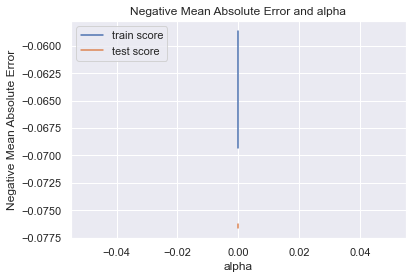

In [272]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [219]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9202564335912067
0.9252245072658245
11.351903585271298
2.916758949792616
0.009719095535335016
0.00998890051298841


##### Lets increase and decrease alpha and check the impact on R2 for lasso regression

In [279]:
#Fitting Ridge model for alpha = 0.001 and printing coefficients which have been penalised

alpha =0.01

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 
print(lasso.coef_)

[ 0.00082052  0.02305997  0.05303544  0.          0.02778919 -0.
 -0.          0.05317003  0.          0.          0.12002507  0.00130429
 -0.          0.          0.00551022 -0.          0.03871918  0.
  0.04873142  0.00565263  0.00635648  0.          0.00398569  0.
 -0.06206339 -0.          0.          0.         -0.          0.
  0.          0.          0.          0.         -0.          0.
 -0.         -0.         -0.          0.         -0.          0.
 -0.          0.          0.          0.         -0.         -0.
  0.          0.         -0.          0.         -0.          0.
 -0.          0.          0.         -0.         -0.          0.
  0.          0.          0.         -0.         -0.         -0.
 -0.         -0.         -0.         -0.         -0.          0.
  0.         -0.          0.         -0.         -0.          0.
  0.          0.          0.         -0.          0.          0.
  0.         -0.         -0.          0.          0.         -0.
 -0.         -0. 

In [280]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.8507595798028982
0.8766750340238866
21.24513534318249
4.810522606951634
0.018189328204779528
0.01647439248956039


##### The test and train r2 score both have come down and hence this value of alpha can't be considered

##### Lets check with even a lower value

In [281]:
#Fitting Ridge model for alpha = 0.001 and printing coefficients which have been penalised

alpha =0.0001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 
print(lasso.coef_)

[ 5.57108296e-03  2.19961256e-02  1.74272249e-02 -3.48716451e-03
 -0.00000000e+00 -3.71475423e-03 -2.37763169e-02  6.13461964e-02
 -8.01883765e-03  1.04769791e-02  1.11564848e-01  9.27948558e-03
 -1.47659462e-04  1.15456824e-02  1.31846674e-02  5.36573452e-03
  1.44098251e-02  3.71765567e-03  2.79905812e-02  1.25886498e-02
  8.21644176e-03  2.89319865e-03  9.85995970e-03 -1.33270367e-03
 -5.78994118e-02 -4.83754189e-02  0.00000000e+00  0.00000000e+00
 -0.00000000e+00 -0.00000000e+00  3.10416485e-02  5.73767612e-02
 -0.00000000e+00  0.00000000e+00 -1.05922566e-01 -0.00000000e+00
 -6.72631751e-02 -0.00000000e+00 -4.55237583e-02  6.56168362e-02
  4.53241700e-02  1.38440564e-02 -1.86938098e-02 -1.12034280e-02
  6.38361195e-03  1.15164968e-02 -0.00000000e+00 -0.00000000e+00
  3.56222882e-02  1.31056457e-02  2.42947462e-02  2.34844530e-02
 -2.70870412e-02 -1.84302751e-02 -2.75024380e-03 -1.33174883e-03
  6.86411047e-02 -0.00000000e+00 -0.00000000e+00  5.14457094e-02
  3.62106565e-02 -7.65857

In [282]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9416435420626293
0.9108426681161349
8.30733956250447
3.4777496771083163
0.007112448255568896
0.01191010163393259


##### The gap between test and train r2 scores have increased and test score has reduced a well so we will go with alpha = 0.001

In [220]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),9.450940e-01,0.937832,0.920256
1,R2 Score (Test),-7.147903e+17,0.924863,0.925225
2,RSS (Train),7.816154e+00,8.849985,11.351904
3,RSS (Test),2.788174e+19,2.930872,2.916759
4,MSE (Train),8.180411e-02,0.087046,0.098585
5,MSE (Test),3.090071e+08,0.100186,0.099944


##### We can see that the R2 and MSE values for Lasso regresion are marginally better than Ridge regression, lets check the value for the betas for the predictor variables

In [221]:
betas = pd.DataFrame(index=X.columns)

In [222]:
betas.rows = X.columns

In [223]:
betas['Linear'] = lm.coef_
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

In [225]:
pd.set_option('display.max_rows', None)
betas

,Linear,Ridge,Lasso
LotFrontage,5.326742e-03,0.006024,0.003785
LotArea,2.219832e-02,0.021756,0.022502
YearRemodAdd,1.748219e-02,0.022012,0.028045
MasVnrArea,-4.096811e-03,-0.002877,-0.000000
BsmtFinSF1,-1.060824e-02,0.005269,0.024999
BsmtFinSF2,-1.245290e-02,-0.001645,0.001147
BsmtUnfSF,-3.288105e-02,-0.019683,-0.001214
TotalBsmtSF,7.130740e-02,0.055174,0.044428
1stFlrSF,-1.412275e-02,0.005304,0.000000
2ndFlrSF,1.206807e-02,0.024885,0.010446


In [228]:
model_parameters = list(ridge.coef_)
cols = X.columns
cols = cols.insert(0, "constant")
ridge_model = list(zip(cols, model_parameters))

In [252]:
ridge_coeff = pd.DataFrame(ridge_model)
ridge_coeff.columns = ['Predictor_Variable','Beta']
ridge_coeff.sort_values(by =['Beta'], ascending = False)

,Predictor_Variable,Beta
10,2ndFlrSF,0.094133
116,OverallCond_8,0.089938
255,SaleCondition_AdjLand,0.089636
107,OverallQual_8,0.087921
106,OverallQual_7,0.083407
62,Neighborhood_CollgCr,0.080456
124,Exterior1st_BrkComm,0.072834
208,Functional_Sev,0.069410
78,Neighborhood_Somerst,0.058011
7,BsmtUnfSF,0.055174


##### One of the predictors has beta 0 so we can remove that and check again

In [253]:
ridge_coeff = ridge_coeff.loc[ridge_coeff['Beta']!=0]
ridge_coeff.sort_values(by =['Beta'], ascending = False)

,Predictor_Variable,Beta
10,2ndFlrSF,0.094133
116,OverallCond_8,0.089938
255,SaleCondition_AdjLand,0.089636
107,OverallQual_8,0.087921
106,OverallQual_7,0.083407
62,Neighborhood_CollgCr,0.080456
124,Exterior1st_BrkComm,0.072834
208,Functional_Sev,0.069410
78,Neighborhood_Somerst,0.058011
7,BsmtUnfSF,0.055174


In [254]:
ridge_coeff.shape

(258, 2)

##### Performing similar steps for Lasso regression as well

In [237]:
model_parameters_lasso = list(lasso.coef_)
cols = X.columns
cols = cols.insert(0, "constant")
lasso_model = list(zip(cols, model_parameters_lasso))

In [238]:
lasso_coeff = pd.DataFrame(lasso_model)
lasso_coeff.columns = ['Predictor_Variable','Beta']
lasso_coeff.sort_values(by =['Beta'], ascending = False)

,Predictor_Variable,Beta
107,OverallQual_8,0.121798
10,2ndFlrSF,0.107889
106,OverallQual_7,0.104643
62,Neighborhood_CollgCr,0.082694
208,Functional_Sev,0.074670
124,Exterior1st_BrkComm,0.074183
194,HeatingQC_TA,0.046821
77,Neighborhood_SawyerW,0.046395
7,BsmtUnfSF,0.044428
116,OverallCond_8,0.038896


##### A lot of coefficients are 0 because of the inherent nature of Lasso, so we will remove those

In [239]:
lasso_coeff = lasso_coeff.loc[lasso_coeff['Beta']!=0]
lasso_coeff.sort_values(by =['Beta'], ascending = False)

,Predictor_Variable,Beta
107,OverallQual_8,0.121798
10,2ndFlrSF,0.107889
106,OverallQual_7,0.104643
62,Neighborhood_CollgCr,0.082694
208,Functional_Sev,0.074670
124,Exterior1st_BrkComm,0.074183
194,HeatingQC_TA,0.046821
77,Neighborhood_SawyerW,0.046395
7,BsmtUnfSF,0.044428
116,OverallCond_8,0.038896


In [241]:
lasso_coeff.shape

(81, 2)

##### Top 10 coefficents for Ridge

In [242]:
ridge_coeff.sort_values(by =['Beta'], ascending = False)[:10]

,Predictor_Variable,Beta
10,2ndFlrSF,0.094133
116,OverallCond_8,0.089938
255,SaleCondition_AdjLand,0.089636
107,OverallQual_8,0.087921
106,OverallQual_7,0.083407
62,Neighborhood_CollgCr,0.080456
124,Exterior1st_BrkComm,0.072834
208,Functional_Sev,0.069410
78,Neighborhood_Somerst,0.058011
7,BsmtUnfSF,0.055174


##### Top 10 coefficients for Lasso

In [244]:
lasso_coeff.sort_values(by =['Beta'], ascending = False)[:10]

,Predictor_Variable,Beta
107,OverallQual_8,0.121798
10,2ndFlrSF,0.107889
106,OverallQual_7,0.104643
62,Neighborhood_CollgCr,0.082694
208,Functional_Sev,0.074670
124,Exterior1st_BrkComm,0.074183
194,HeatingQC_TA,0.046821
77,Neighborhood_SawyerW,0.046395
7,BsmtUnfSF,0.044428
116,OverallCond_8,0.038896


##### Since checking only the positive coeffients are not enough, the ones with negative coeffients (the ones which will have will pull the sales price of the house down) is also necessary to be prepared ahead of time. 

In [245]:
ridge_coeff.sort_values(by =['Beta'], ascending = False)[-3:]

,Predictor_Variable,Beta
36,MSSubClass_120,-0.060020
110,OverallCond_2,-0.077975
66,Neighborhood_IDOTRR,-0.079294


In [246]:
lasso_coeff.sort_values(by =['Beta'], ascending = False)[-3:]

,Predictor_Variable,Beta
102,OverallQual_3,-0.054009
111,OverallCond_3,-0.064913
110,OverallCond_2,-0.072805


##### One thing to note is that we took the log of the target variable since it was skewed, so we should actually take the exponential of the coefficients so that the equation become linear

In [258]:
ridge_coeff_up = ridge_coeff.sort_values(by =['Beta'], ascending = False)[:10]
ridge_coeff_down = ridge_coeff.sort_values(by =['Beta'], ascending = False)[-3:]
ridge_coeff_imp = pd.concat([ridge_coeff_up,ridge_coeff_down],axis=0)
ridge_coeff_imp['Beta'] = np.exp(ridge_coeff_imp['Beta'])
ridge_coeff_imp.sort_values(by=['Beta'],ascending=False)

,Predictor_Variable,Beta
10,2ndFlrSF,1.098706
116,OverallCond_8,1.094106
255,SaleCondition_AdjLand,1.093776
107,OverallQual_8,1.091902
106,OverallQual_7,1.086985
62,Neighborhood_CollgCr,1.083781
124,Exterior1st_BrkComm,1.075551
208,Functional_Sev,1.071875
78,Neighborhood_Somerst,1.059727
7,BsmtUnfSF,1.056725


In [259]:
lasso_coeff_up = lasso_coeff.sort_values(by =['Beta'], ascending = False)[:10]
lasso_coeff_down = lasso_coeff.sort_values(by =['Beta'], ascending = False)[-3:]
lasso_coeff_imp = pd.concat([lasso_coeff_up,lasso_coeff_down],axis=0)
lasso_coeff_imp['Beta'] = np.exp(lasso_coeff_imp['Beta'])
lasso_coeff_imp.sort_values(by=['Beta'],ascending=False)

,Predictor_Variable,Beta
107,OverallQual_8,1.129525
10,2ndFlrSF,1.113924
106,OverallQual_7,1.110314
62,Neighborhood_CollgCr,1.086209
208,Functional_Sev,1.077528
124,Exterior1st_BrkComm,1.077004
194,HeatingQC_TA,1.047934
77,Neighborhood_SawyerW,1.047488
7,BsmtUnfSF,1.045429
116,OverallCond_8,1.039662


##### One thing to note is that the value of R2, RSS and MSE for both Ridge and Lasso are very close but Lasso's scores are slightly better, also, Lasso is doing feature selection and it is providing only 81 features compared to 258 for ridge. So it is better to go for Lasso regression since we would be choosing the simpler model in that case

##### The top 5 features after lasso regression that the company should be focusing on is 'OverallQual_8' (very good quality), '2ndFlrSF' (higher the second floor area better is the sale), 'OverallQual_7' (good quality houses), 'Neighbourhood_CollgCr' (Neighborhood should be college creek), 'Functional_Sev' (Home functionality Severely damaged - This is surprising, looks like people are looking to get cheap deals on functionally damaged houses). The compant should stop selling houses which have OverallQual_3 (Fair Quality Houses), OverallCond_3 (Fair Condition houses) and OverallCond_2 (Poor condition houses). The Beta values of each of these predictors is given in the table below.



##### Doubling the value of alpha for Lasso and Ridge we will check what are the features that we get now

### Ridge

In [261]:
#Fitting Ridge model for alpha = 7 and printing coefficients which have been penalised
alpha = 14
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 0.00649001  0.02202152  0.02433912 -0.00170056  0.01110041  0.0006218
 -0.01417295  0.05084357  0.01167477  0.02891335  0.08651103  0.00880266
  0.00027572  0.01155364  0.01390481  0.0046856   0.01796017  0.00409162
  0.02937333  0.01181926  0.00813462  0.00292288  0.01035515 -0.00133769
 -0.04739853 -0.03466283  0.00556749  0.00090463 -0.00519147 -0.00465305
  0.03895938  0.02551619  0.00158989  0.00612052 -0.03452086  0.00803986
 -0.05176744 -0.01088647 -0.01912824  0.03478434  0.01443131  0.00914834
 -0.02769048 -0.0048154   0.0144961   0.01080549 -0.01770966 -0.00144285
  0.03129297  0.00989974  0.01095264  0.02558479 -0.01754888 -0.00496597
 -0.000295   -0.00210086  0.02539628 -0.003159   -0.00723416  0.03122122
  0.02461037 -0.0119305   0.07024778 -0.05148118 -0.01617417  0.00569316
 -0.05688535 -0.02910021 -0.02227872  0.00825249 -0.02324164  0.00909617
  0.03889569 -0.02177292  0.00253976 -0.01824913 -0.0165125   0.0345123
  0.04483788  0.00969778  0.0194228  -0.00325239  0.0

In [262]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9336806016536927
0.9268745726219267
9.440904762161033
2.852395042325455
0.008082966405959789
0.009768476172347449


In [263]:
#Fitting Ridge model for alpha = 0.001 and printing coefficients which have been penalised

alpha =0.002

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 
print(lasso.coef_)

[ 3.33240581e-03  2.52008237e-02  3.61130230e-02 -0.00000000e+00
  2.79195189e-02  1.46688307e-04 -0.00000000e+00  4.66598194e-02
  0.00000000e+00  5.35195743e-03  1.10564329e-01  8.01590192e-03
  0.00000000e+00  8.82377997e-05  7.12273462e-03 -0.00000000e+00
  2.52306288e-02  0.00000000e+00  4.03603355e-02  1.07416708e-02
  9.00491796e-03  6.92025489e-04  1.02434589e-02 -0.00000000e+00
 -4.64470181e-02 -0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -0.00000000e+00  5.73563271e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -6.46610664e-03  0.00000000e+00
 -1.62577232e-02 -0.00000000e+00 -0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.10571191e-02 -0.00000000e+00
  0.00000000e+00  0.00000000e+00 -0.00000000e+00 -3.97290208e-03
  0.00000000e+00  0.00000000e+00 -0.00000000e+00  0.00000000e+00
 -0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -0.00000000e+00 -0.00000000e+00  0.00000000e+00
  0.00000000e+00 -0.00000

In [264]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9047428357860263
0.9116263211679073
13.560343393973717
3.44718181364515
0.011609883042785717
0.011805417170017637


In [265]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),9.450940e-01,0.933681,0.904743
1,R2 Score (Test),-7.147903e+17,0.926875,0.911626
2,RSS (Train),7.816154e+00,9.440905,13.560343
3,RSS (Test),2.788174e+19,2.852395,3.447182
4,MSE (Train),8.180411e-02,0.089905,0.107749
5,MSE (Test),3.090071e+08,0.098836,0.108653


##### For ridge regression the R2 score for test increases very marginally from 92.5 to 92.7. For lasso the change is much more rapid, for training dataset the R2 reduces from 92 to 90.5, while for test it reduces from 92.5 to 91.2

##### Checking the most important predictor variables for lasso and ridge after doubling alpha

##### Ridge

In [267]:
model_parameters = list(ridge.coef_)
cols = X.columns
cols = cols.insert(0, "constant")
ridge_model = list(zip(cols, model_parameters))

ridge_coeff = pd.DataFrame(ridge_model)
ridge_coeff.columns = ['Predictor_Variable','Beta']
ridge_coeff = ridge_coeff.loc[ridge_coeff['Beta']!=0]


ridge_coeff_up = ridge_coeff.sort_values(by =['Beta'], ascending = False)[:10]
ridge_coeff_down = ridge_coeff.sort_values(by =['Beta'], ascending = False)[-3:]
ridge_coeff_imp = pd.concat([ridge_coeff_up,ridge_coeff_down],axis=0)
ridge_coeff_imp['Beta'] = np.exp(ridge_coeff_imp['Beta'])
ridge_coeff_imp.sort_values(by=['Beta'],ascending=False)

,Predictor_Variable,Beta
10,2ndFlrSF,1.090363
106,OverallQual_7,1.080163
107,OverallQual_8,1.076955
62,Neighborhood_CollgCr,1.072774
116,OverallCond_8,1.070777
208,Functional_Sev,1.067312
124,Exterior1st_BrkComm,1.066328
255,SaleCondition_AdjLand,1.056384
7,BsmtUnfSF,1.052158
194,HeatingQC_TA,1.051204


In [268]:
model_parameters = list(lasso.coef_)
cols = X.columns
cols = cols.insert(0, "constant")
lasso_model = list(zip(cols, model_parameters_lasso))

lasso_coeff = pd.DataFrame(lasso_model)
lasso_coeff.columns = ['Predictor_Variable','Beta']
lasso_coeff = lasso_coeff.loc[lasso_coeff['Beta']!=0]


lasso_coeff_up = lasso_coeff.sort_values(by =['Beta'], ascending = False)[:10]
lasso_coeff_down = lasso_coeff.sort_values(by =['Beta'], ascending = False)[-3:]
lasso_coeff_imp = pd.concat([lasso_coeff_up,lasso_coeff_down],axis=0)
lasso_coeff_imp['Beta'] = np.exp(lasso_coeff_imp['Beta'])
lasso_coeff_imp.sort_values(by=['Beta'],ascending=False)

,Predictor_Variable,Beta
107,OverallQual_8,1.129525
10,2ndFlrSF,1.113924
106,OverallQual_7,1.110314
62,Neighborhood_CollgCr,1.086209
208,Functional_Sev,1.077528
124,Exterior1st_BrkComm,1.077004
194,HeatingQC_TA,1.047934
77,Neighborhood_SawyerW,1.047488
7,BsmtUnfSF,1.045429
116,OverallCond_8,1.039662


##### Code for lasso excluding the top 5 most important predictor variables

In [288]:
lasso_top_5 = ['OverallQual_8','2ndFlrSF','OverallQual_7','Neighborhood_CollgCr','Functional_Sev']

In [289]:
## drop them from train and test data
X_train_l = X_train.drop(lasso_top_5, axis=1)
X_test_l = X_test.drop(lasso_top_5, axis=1)

In [290]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train_l, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [291]:
model_cv.best_params_

{'alpha': 0.0001}

In [292]:
#Fitting Ridge model for alpha = 0.001 and printing coefficients which have been penalised

alpha =0.0001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_l, y_train) 
print(lasso.coef_)

[ 6.72562746e-03  2.16333306e-02  1.78003530e-02 -1.28685726e-03
 -1.65408848e-03 -5.93070563e-03 -2.57278655e-02  6.47601822e-02
 -1.30783313e-02  1.20682985e-01  8.52227255e-03 -1.36072895e-04
  1.02373708e-02  1.33506422e-02  5.92041403e-03  1.25683958e-02
  3.11747682e-03  2.91372561e-02  1.35427074e-02  8.88631452e-03
  2.79446618e-03  1.02495823e-02 -0.00000000e+00 -5.90806406e-02
 -4.76045242e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.76606754e-03  3.27951996e-02  6.16765607e-02 -0.00000000e+00
  0.00000000e+00 -1.09970408e-01 -0.00000000e+00 -7.65713074e-02
 -0.00000000e+00 -4.60698099e-02  4.60816288e-02  4.58273424e-02
  1.11690255e-02 -1.87032268e-02 -1.18469783e-02  5.07987821e-03
  9.86056096e-03 -0.00000000e+00  6.25869190e-04  4.36011267e-02
  8.71304335e-03  2.25407172e-02  2.37729106e-02 -2.83353988e-02
 -3.32293610e-02 -1.28671719e-03 -0.00000000e+00  6.08647926e-02
 -0.00000000e+00  0.00000000e+00  5.12560173e-02  3.60543056e-02
  1.00430267e-01 -4.71483

In [293]:
# cv_results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=.002]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.086049,0.036872,0.007348,0.001552,0.0001,{'alpha': 0.0001},-0.067701,-0.083343,-0.080092,-0.081980,...,-0.077626,0.005711,1,-0.061049,-0.057831,-0.058344,-0.058565,-0.060917,-0.059341,0.001362
1,0.029953,0.003720,0.007689,0.000745,0.001,{'alpha': 0.001},-0.068019,-0.084838,-0.080912,-0.082055,...,-0.077733,0.006286,2,-0.073849,-0.068569,-0.070197,-0.071077,-0.072056,-0.071150,0.001771


In [294]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train_l)
y_pred_test = lasso.predict(X_test_l)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9402701268938501
0.9090218837531802
8.502852219896871
3.5487728010236665
0.0072798392293637595
0.012153331510355022


In [295]:
model_parameters_lasso = list(lasso.coef_)
cols = X.columns
cols = cols.insert(0, "constant")
lasso_model = list(zip(cols, model_parameters_lasso))

In [296]:
lasso_coeff = pd.DataFrame(lasso_model)
lasso_coeff.columns = ['Predictor_Variable','Beta']
lasso_coeff.sort_values(by =['Beta'], ascending = False)

,Predictor_Variable,Beta
250,SaleType_ConLI,0.237264
112,OverallCond_4,0.157604
9,1stFlrSF,0.120683
76,Neighborhood_Sawyer,0.106825
60,Neighborhood_BrkSide,0.100430
249,SaleType_ConLD,0.096046
120,RoofStyle_Hip,0.093124
111,OverallCond_3,0.083973
203,KitchenQual_TA,0.082132
247,SaleType_CWD,0.080427


In [297]:
lasso_coeff = lasso_coeff.loc[lasso_coeff['Beta']!=0]
lasso_coeff.sort_values(by =['Beta'], ascending = False)

,Predictor_Variable,Beta
250,SaleType_ConLI,0.237264
112,OverallCond_4,0.157604
9,1stFlrSF,0.120683
76,Neighborhood_Sawyer,0.106825
60,Neighborhood_BrkSide,0.100430
249,SaleType_ConLD,0.096046
120,RoofStyle_Hip,0.093124
111,OverallCond_3,0.083973
203,KitchenQual_TA,0.082132
247,SaleType_CWD,0.080427


In [298]:
lasso_coeff.sort_values(by =['Beta'], ascending = False)[:10]

,Predictor_Variable,Beta
250,SaleType_ConLI,0.237264
112,OverallCond_4,0.157604
9,1stFlrSF,0.120683
76,Neighborhood_Sawyer,0.106825
60,Neighborhood_BrkSide,0.100430
249,SaleType_ConLD,0.096046
120,RoofStyle_Hip,0.093124
111,OverallCond_3,0.083973
203,KitchenQual_TA,0.082132
247,SaleType_CWD,0.080427
